In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torchvision import models
torch.manual_seed(0)

In [ ]:
import zipfile

zip_file_path = '/content/drive/MyDrive/maps.zip'
extracted_folder_path = '/content/Maps'  # Change to your desired extraction path

# Create the target directory if it doesn't exist.
import os
os.makedirs(extracted_folder_path, exist_ok=True)

# Unzip the file.
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

In [ ]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
class ContractingBlock(nn.Module):
    '''
    ContractingBlock Class
    Performs two convolutions followed by a max pool operation.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ContractingBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(input_channels * 2, input_channels * 2, kernel_size=3, padding=1)
        self.activation = nn.LeakyReLU(0.2)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels * 2)
        self.use_bn = use_bn
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x):
        '''
        Function for completing a forward pass of ContractingBlock:
        Given an image tensor, completes a contracting block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.maxpool(x)
        return x

In [ ]:
class FeatureMapBlock(nn.Module):
    '''
    FeatureMapBlock Class
    The final layer of a U-Net -
    maps each pixel to a pixel with the correct number of output dimensions
    using a 1x1 convolution.
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)

    def forward(self, x):
        '''
        Function for completing a forward pass of FeatureMapBlock:
        Given an image tensor, returns it mapped to the desired number of channels.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv(x)
        return x

In [ ]:
def crop(image, new_shape):
    '''
    Function for cropping an image tensor: Given an image tensor and the new shape,
    crops to the center pixels.
    Parameters:
        image: image tensor of shape (batch size, channels, height, width)
        new_shape: a torch.Size object with the shape you want x to have
    '''
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - round(new_shape[2] / 2)
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - round(new_shape[3] / 2)
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
    return cropped_image

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_features, norm_layer=nn.InstanceNorm2d):
        super(ResidualBlock, self).__init__()

        conv_block = [nn.ReflectionPad2d(1),
                      nn.Conv2d(in_features, in_features, 3),
                      norm_layer(in_features),
                      nn.ReLU(inplace=True),
                      nn.ReflectionPad2d(1),
                      nn.Conv2d(in_features, in_features, 3),
                      norm_layer(in_features)]

        self.conv_block = nn.Sequential(*conv_block)

    def forward(self, x):
        return x + self.conv_block(x)

In [ ]:
class ResNet9(nn.Module):
    """
    Generator with 9 residual blocks and reflection padding.
    """

    def __init__(self, image_channel=3, norm='instancenorm', n_res_blocks=9):
        super(ResNet9, self).__init__()
        if norm == 'batchnorm':
            norm_layer = nn.BatchNorm2d
        elif norm == 'instancenorm':
            norm_layer = nn.InstanceNorm2d
        else:
            raise Exception("Norm not specified!")

        # Downsample
        model = [nn.ReflectionPad2d(3),
                 nn.Conv2d(image_channel, 64, 7),
                 norm_layer(64),
                 nn.ReLU(inplace=True)]

        in_channels = 64
        out_channels = in_channels * 2
        # 256 -> 128
        for i in range(2):
            model += [nn.Conv2d(in_channels, out_channels, 3, stride=2, padding=1),
                      norm_layer(out_channels),
                      nn.ReLU(inplace=True)]
            in_channels = out_channels
            out_channels = in_channels * 2

        # Residual blocks
        for i in range(n_res_blocks):
            model += [ResidualBlock(in_channels, norm_layer=norm_layer)]

        # Upsample
        out_channels = in_channels // 2
        for i in range(2):
            model += [nn.ConvTranspose2d(in_channels, out_channels, 3, stride=2, padding=1, output_padding=1),
                      norm_layer(out_channels),
                      nn.ReLU(inplace=True)]
            in_channels = out_channels
            out_channels = in_channels // 2

        model += [nn.ReflectionPad2d(3),
                  nn.Conv2d(64, 3, 7),
                  nn.Tanh()]

        self.model = nn.Sequential(*model)


    def forward(self, input):
        return self.model(input)

In [ ]:
from torchsummary import summary
device = 'cuda'
model=ResNet9(3,'instancenorm',9).to(device)

# Print the model summary
summary(model, (3, 256, 256))  # Adjust input size as needed

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1          [-1, 3, 262, 262]               0
            Conv2d-2         [-1, 64, 256, 256]           9,472
    InstanceNorm2d-3         [-1, 64, 256, 256]               0
              ReLU-4         [-1, 64, 256, 256]               0
            Conv2d-5        [-1, 128, 128, 128]          73,856
    InstanceNorm2d-6        [-1, 128, 128, 128]               0
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8          [-1, 256, 64, 64]         295,168
    InstanceNorm2d-9          [-1, 256, 64, 64]               0
             ReLU-10          [-1, 256, 64, 64]               0
  ReflectionPad2d-11          [-1, 256, 66, 66]               0
           Conv2d-12          [-1, 256, 64, 64]         590,080
   InstanceNorm2d-13          [-1, 256, 64, 64]               0
             ReLU-14          [-1, 256,

In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Structured like the contracting path of the U-Net, the discriminator will
    output a matrix of values classifying corresponding portions of the image as real or fake.
    Parameters:
        input_channels: the number of image input channels
        hidden_channels: the initial number of discriminator convolutional filters
    '''
    def __init__(self, input_channels, hidden_channels=8):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        self.contract3 = ContractingBlock(hidden_channels * 4)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.final = nn.Conv2d(hidden_channels * 16, 1, kernel_size=1)

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        xn = self.final(x4)
        return xn

In [ ]:
import torch.nn.functional as F
# New parameters
adv_criterion = nn.BCEWithLogitsLoss()
recon_criterion = nn.L1Loss()
lambda_recon = 200

n_epochs = 10
input_dim = 3
real_dim = 3
display_step = 200
batch_size = 4
lr = 0.0002
target_shape = 256


In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

import torchvision
dataset = torchvision.datasets.ImageFolder("/content/Maps/Files/maps", transform=transform)

In [19]:
gen = ResNet9(3,'instancenorm',9).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(input_dim + real_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

# Can be changed to False if not using a pretrained model
pretrained = True
if pretrained:
    loaded_state = torch.load("/content/pix2pix_5400.pth")
    gen.load_state_dict(loaded_state["gen"])
    gen_opt.load_state_dict(loaded_state["gen_opt"])
    disc.load_state_dict(loaded_state["disc"])
    disc_opt.load_state_dict(loaded_state["disc_opt"])
else:
    gen = gen.apply(weights_init)
    disc = disc.apply(weights_init)

In [20]:
def get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator; takes the condition and returns potential images
        disc: the discriminator; takes images and the condition and
          returns real/fake prediction matrices
        real: the real images (e.g. maps) to be used to evaluate the reconstruction
        condition: the source images (e.g. satellite imagery) which are used to produce the real images
        adv_criterion: the adversarial loss function; takes the discriminator
                  predictions and the true labels and returns a adversarial
                  loss (which you aim to minimize)
        recon_criterion: the reconstruction loss function; takes the generator
                    outputs and the real images and returns a reconstructuion
                    loss (which you aim to minimize)
        lambda_recon: the degree to which the reconstruction loss should be weighted in the sum
    '''
    fake = gen(condition)
    disc_fake_hat = disc(fake, condition)
    gen_adv_loss = adv_criterion(disc_fake_hat, torch.ones_like(disc_fake_hat))
    gen_rec_loss = recon_criterion(real, fake)
    gen_loss = gen_adv_loss + lambda_recon * gen_rec_loss
    return gen_loss

In [ ]:
def test_gen_reasonable(num_images=10):
    gen = torch.zeros_like
    disc = lambda x, y: torch.ones(len(x), 1)
    real = None
    condition = torch.ones(num_images, 3, 10, 10)
    adv_criterion = torch.mul
    recon_criterion = lambda x, y: torch.tensor(0)
    lambda_recon = 0
    assert get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon).sum() == num_images

    disc = lambda x, y: torch.zeros(len(x), 1)
    assert torch.abs(get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)).sum() == 0

    adv_criterion = lambda x, y: torch.tensor(0)
    recon_criterion = lambda x, y: torch.abs(x - y).max()
    real = torch.randn(num_images, 3, 10, 10)
    lambda_recon = 2
    gen = lambda x: real + 1
    assert torch.abs(get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon) - 2) < 1e-4

    adv_criterion = lambda x, y: (x + y).max() + x.max()
    assert torch.abs(get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon) - 3) < 1e-4
test_gen_reasonable()
print("Success!")

Success!


  0%|          | 0/549 [00:00<?, ?it/s]

Pretrained initial state


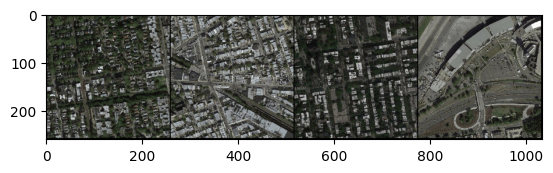

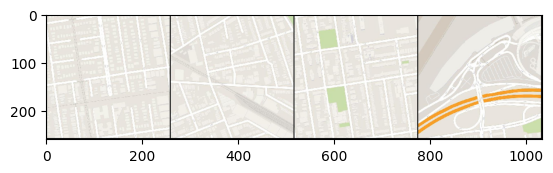

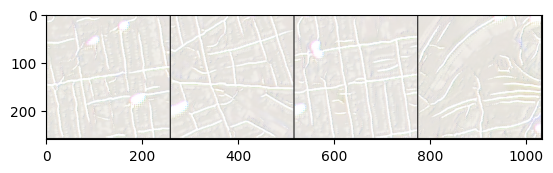

Epoch 0: Step 5600: Generator (ResNet9) loss: 9.52769151926041, Discriminator loss: 0.34351210128515963


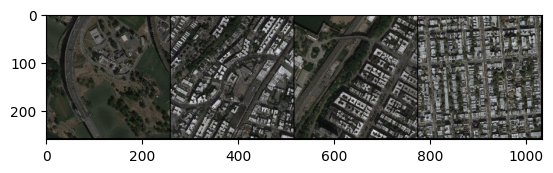

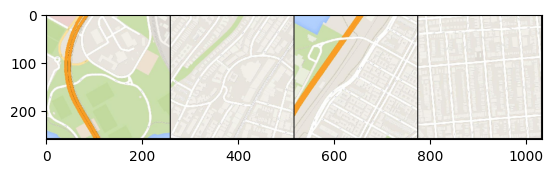

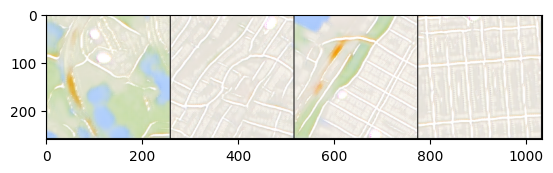

Epoch 0: Step 5800: Generator (ResNet9) loss: 9.911570084094995, Discriminator loss: 0.3027676301449536


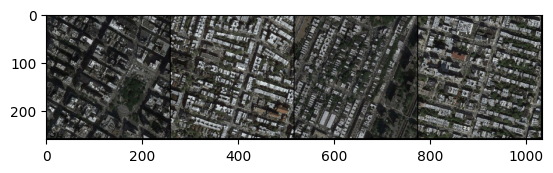

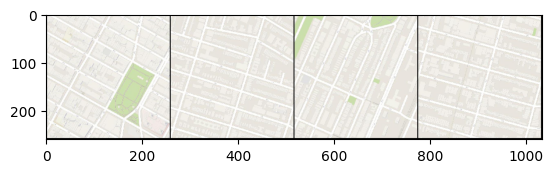

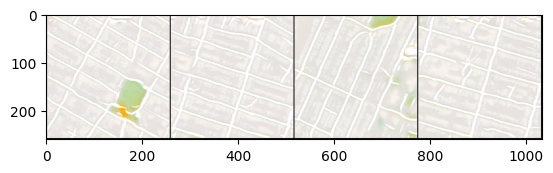

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 1: Step 6000: Generator (ResNet9) loss: 10.07634464979172, Discriminator loss: 0.2922414437308908


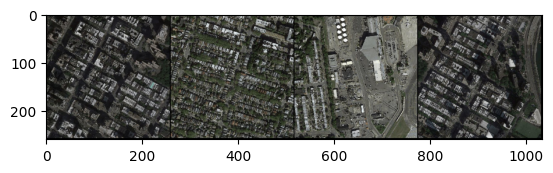

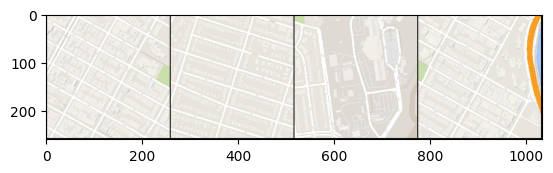

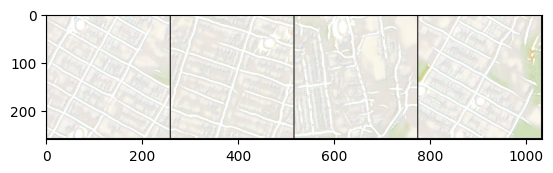

Epoch 1: Step 6200: Generator (ResNet9) loss: 10.139700756073003, Discriminator loss: 0.2534516050107776


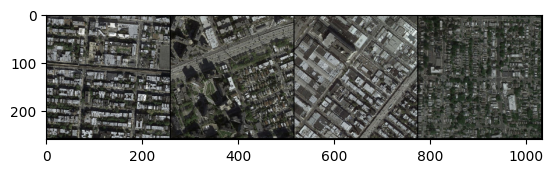

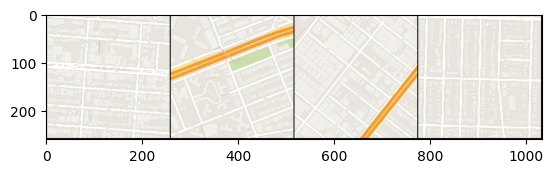

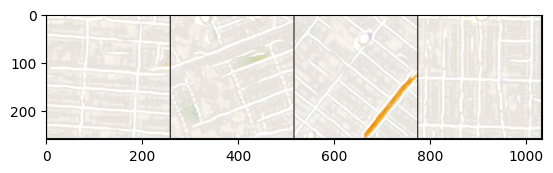

Epoch 1: Step 6400: Generator (ResNet9) loss: 9.945449695587154, Discriminator loss: 0.35313580431044117


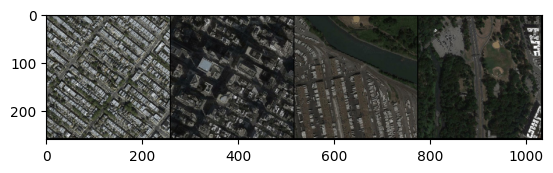

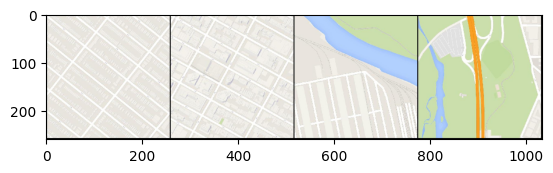

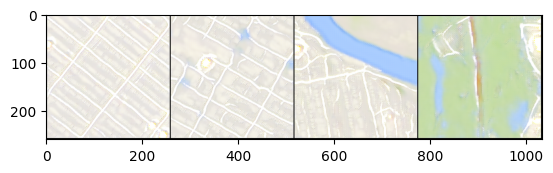

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 2: Step 6600: Generator (ResNet9) loss: 9.71317780971527, Discriminator loss: 0.29466920966282484


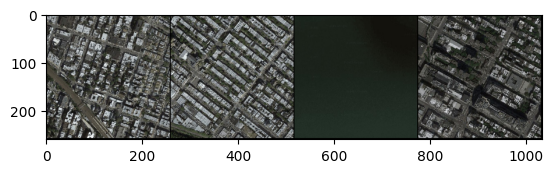

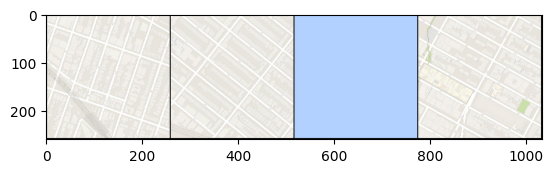

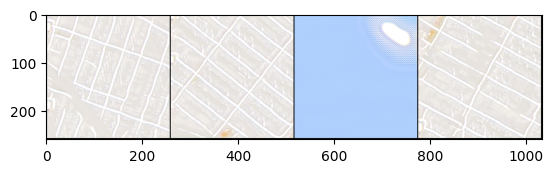

Epoch 2: Step 6800: Generator (ResNet9) loss: 10.409975810050963, Discriminator loss: 0.2234679060056805


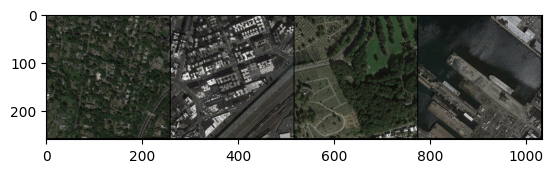

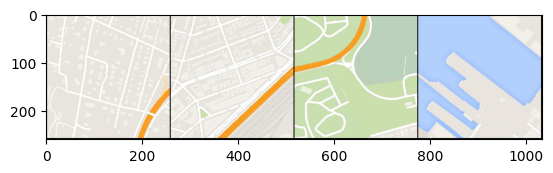

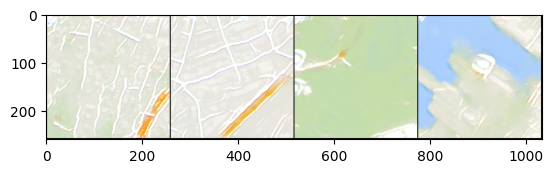

Epoch 2: Step 7000: Generator (ResNet9) loss: 10.35993514060974, Discriminator loss: 0.11350693716667583


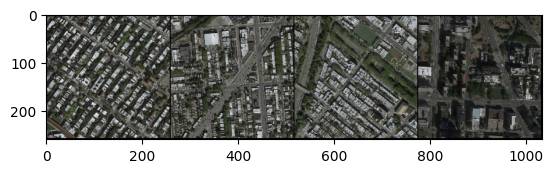

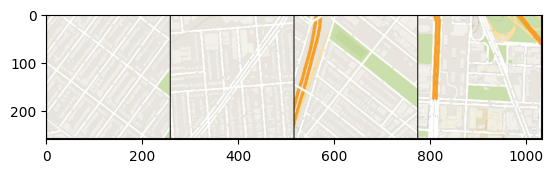

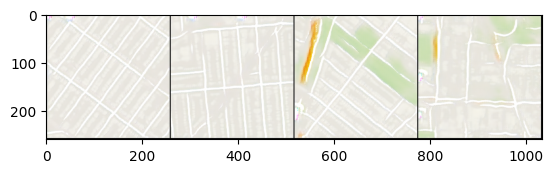

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 3: Step 7200: Generator (ResNet9) loss: 9.842243394851684, Discriminator loss: 0.033807665016502154


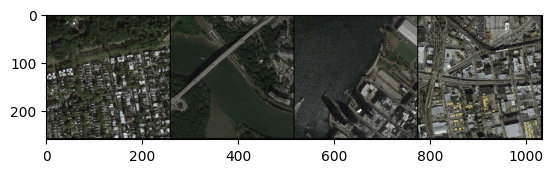

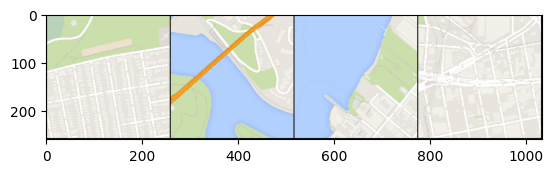

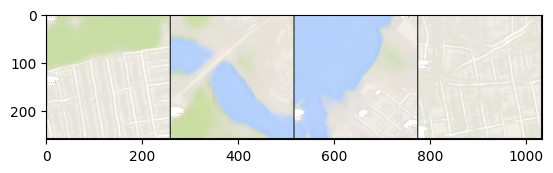

Epoch 3: Step 7400: Generator (ResNet9) loss: 10.606459059715265, Discriminator loss: 0.020598145388066768


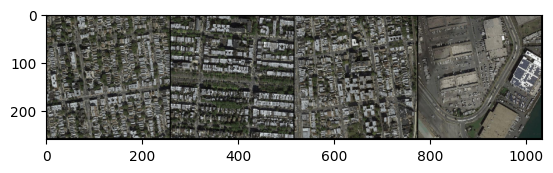

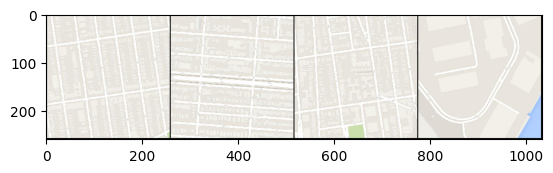

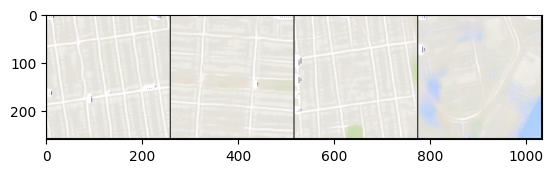

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 4: Step 7600: Generator (ResNet9) loss: 10.778281602859494, Discriminator loss: 0.01902731142006815


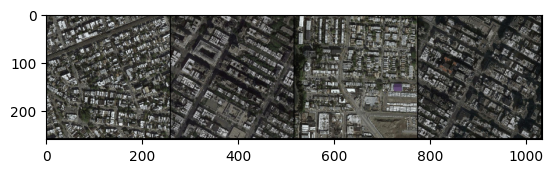

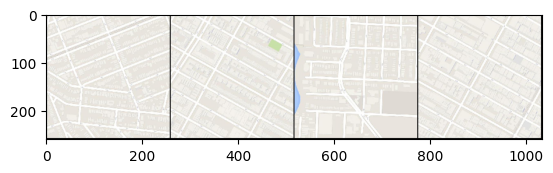

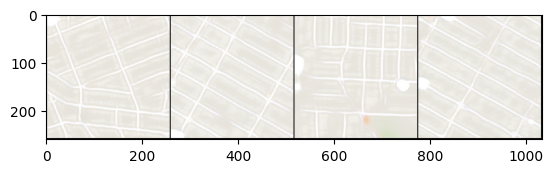

Epoch 4: Step 7800: Generator (ResNet9) loss: 10.902623472213751, Discriminator loss: 0.05748767112847418


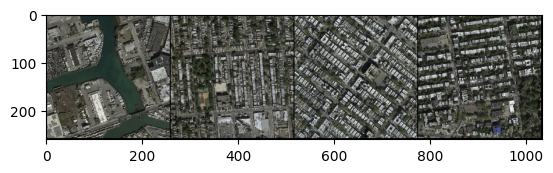

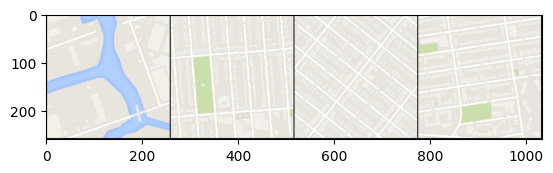

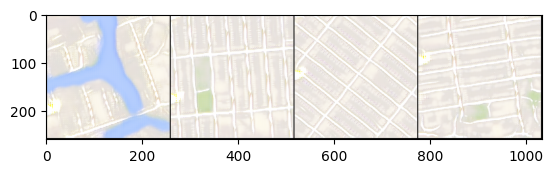

Epoch 4: Step 8000: Generator (ResNet9) loss: 10.692219383716585, Discriminator loss: 0.19132510483264928


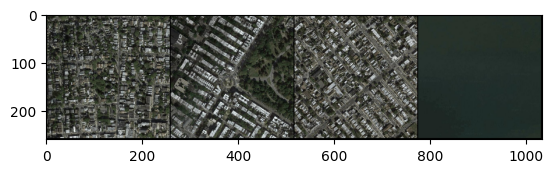

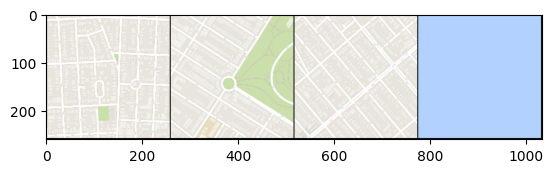

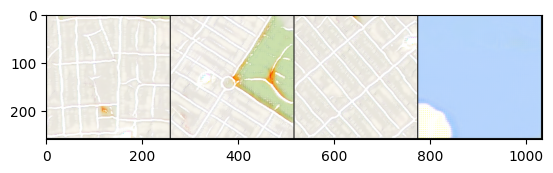

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 5: Step 8200: Generator (ResNet9) loss: 10.60001854419708, Discriminator loss: 0.26542967720888533


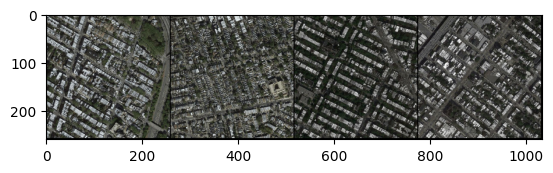

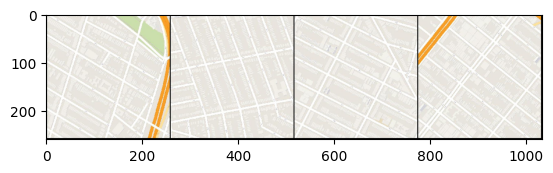

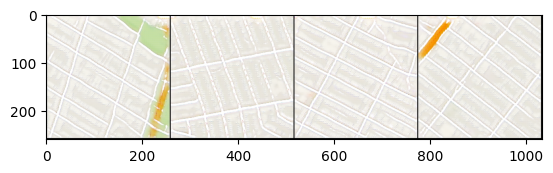

Epoch 5: Step 8400: Generator (ResNet9) loss: 10.72658481359481, Discriminator loss: 0.19399785557761795


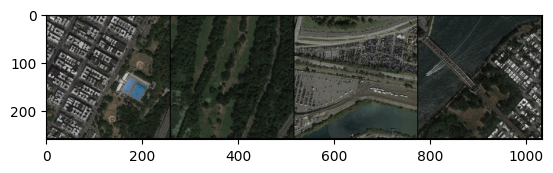

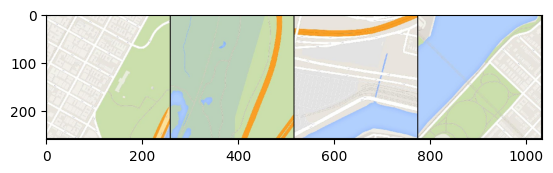

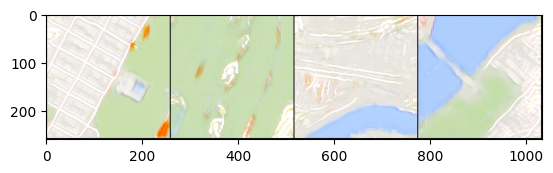

Epoch 5: Step 8600: Generator (ResNet9) loss: 10.252501397132873, Discriminator loss: 0.34196220549754813


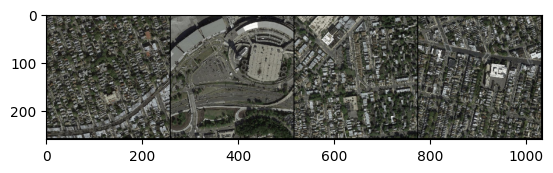

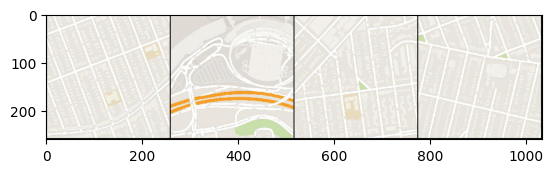

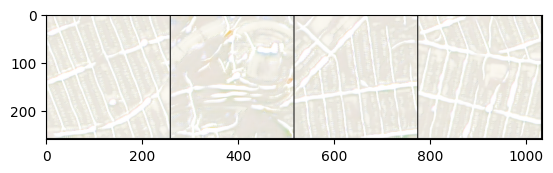

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 6: Step 8800: Generator (ResNet9) loss: 10.585314161777491, Discriminator loss: 0.23778383761644353


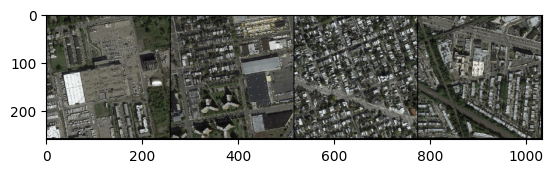

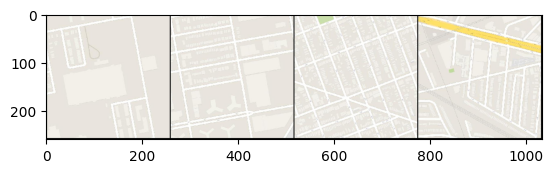

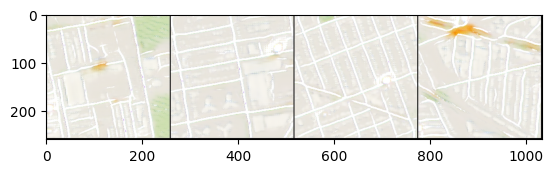

Epoch 6: Step 9000: Generator (ResNet9) loss: 10.76474678039551, Discriminator loss: 0.20355885932222


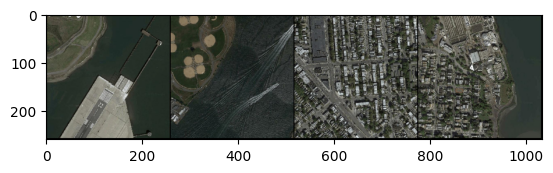

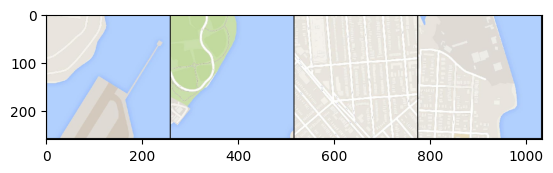

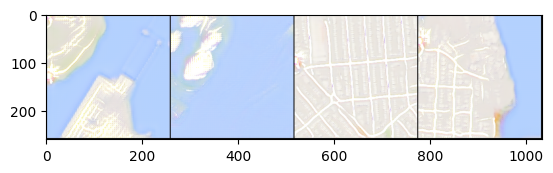

Epoch 6: Step 9200: Generator (ResNet9) loss: 11.015611286163333, Discriminator loss: 0.16844634875655176


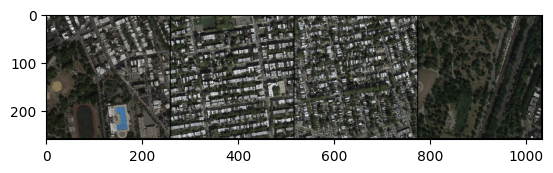

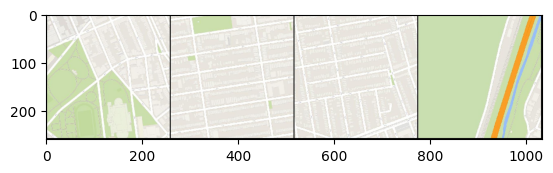

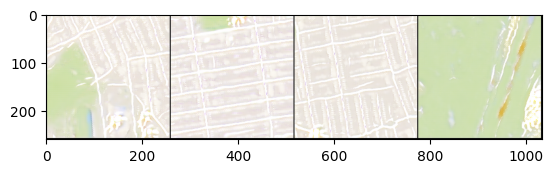

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 7: Step 9400: Generator (ResNet9) loss: 11.294956009387976, Discriminator loss: 0.1541602749330922


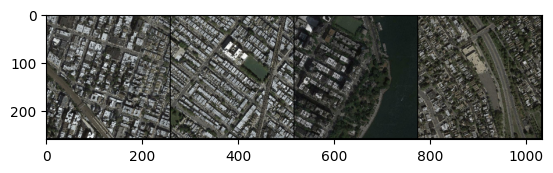

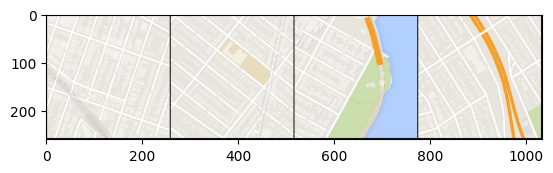

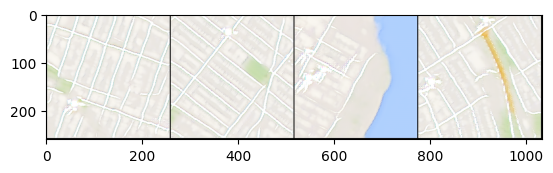

Epoch 7: Step 9600: Generator (ResNet9) loss: 11.281163980960853, Discriminator loss: 0.176065945951268


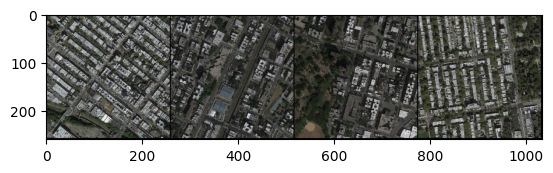

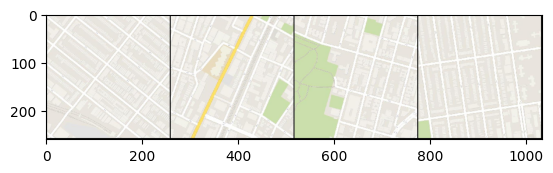

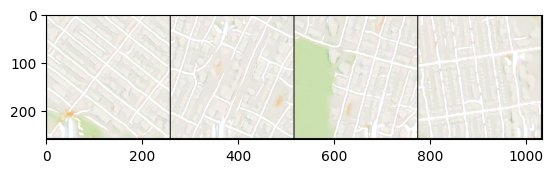

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 8: Step 9800: Generator (ResNet9) loss: 11.380015940666196, Discriminator loss: 0.12289808309637011


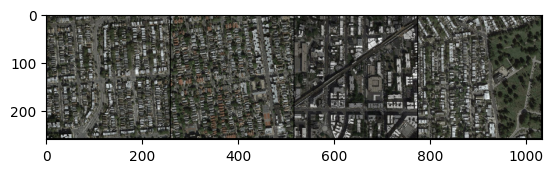

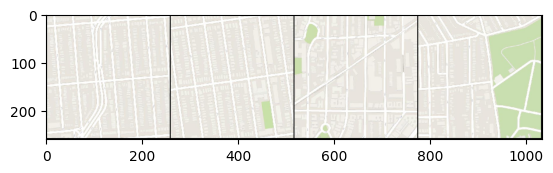

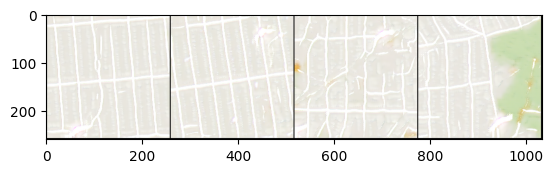

Epoch 8: Step 10000: Generator (ResNet9) loss: 10.749568243026728, Discriminator loss: 0.17831279645673928


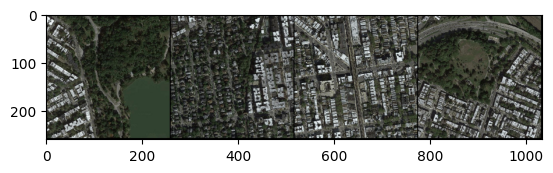

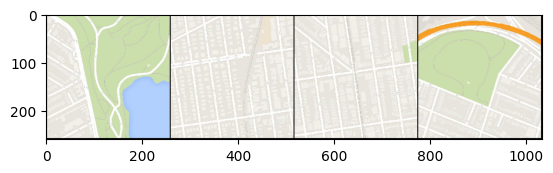

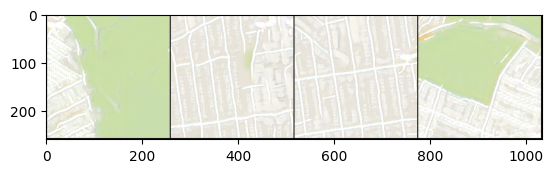

Epoch 8: Step 10200: Generator (ResNet9) loss: 11.15035430431366, Discriminator loss: 0.16305666744709021


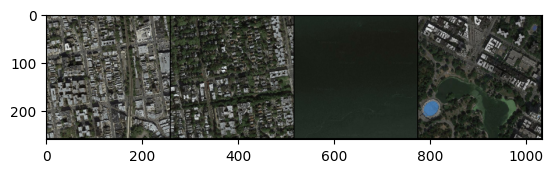

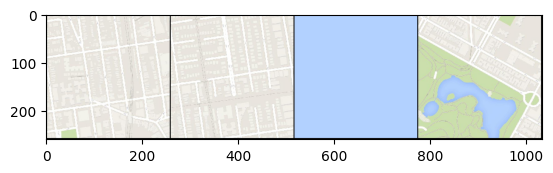

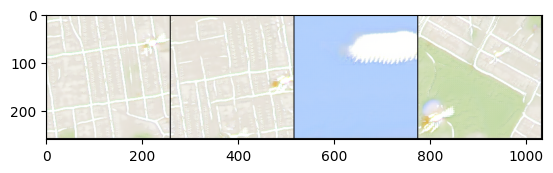

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 9: Step 10400: Generator (ResNet9) loss: 11.226368291378021, Discriminator loss: 0.11692918053828173


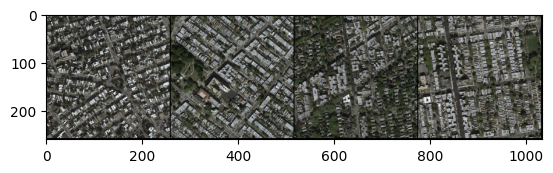

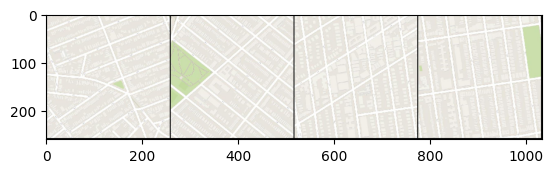

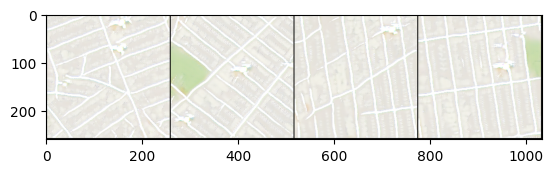

Epoch 9: Step 10600: Generator (ResNet9) loss: 11.066174013614647, Discriminator loss: 0.15029487158171836


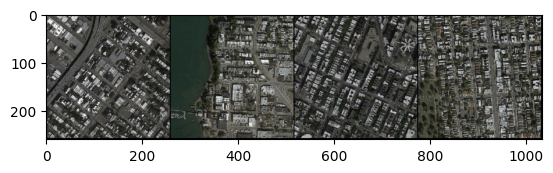

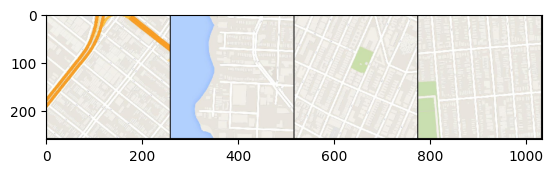

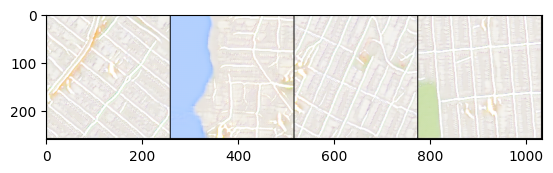

Epoch 9: Step 10800: Generator (ResNet9) loss: 11.701600689888005, Discriminator loss: 0.12866353319026527


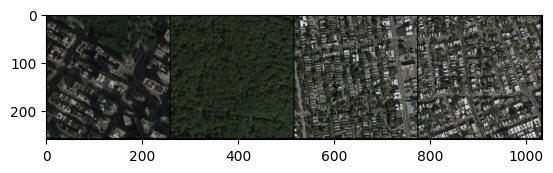

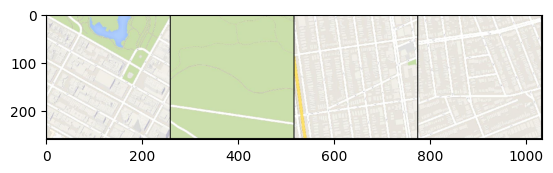

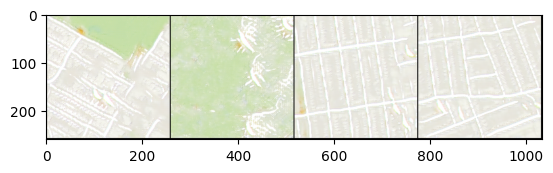

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 10: Step 11000: Generator (ResNet9) loss: 10.810599234104151, Discriminator loss: 0.20946811085566874


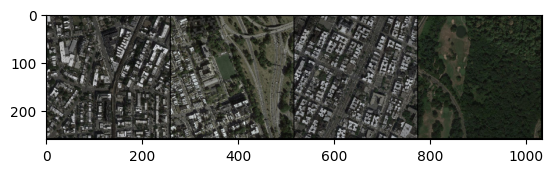

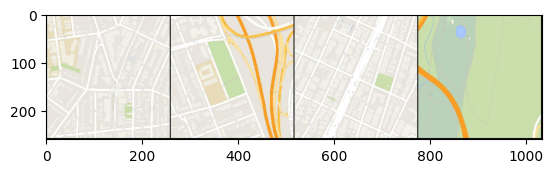

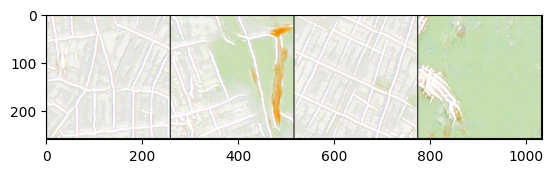

Epoch 10: Step 11200: Generator (ResNet9) loss: 10.936714899539945, Discriminator loss: 0.16869315857067713


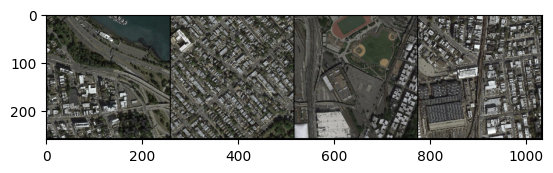

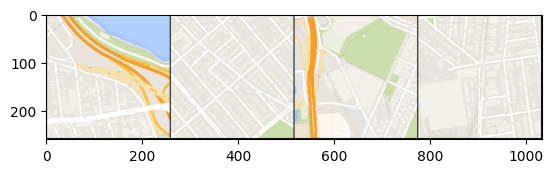

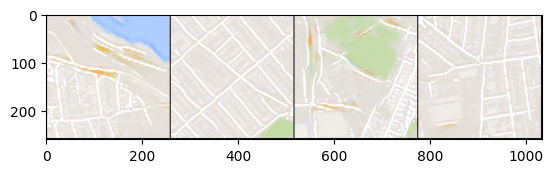

Epoch 10: Step 11400: Generator (ResNet9) loss: 10.404892549514768, Discriminator loss: 0.26206666796468214


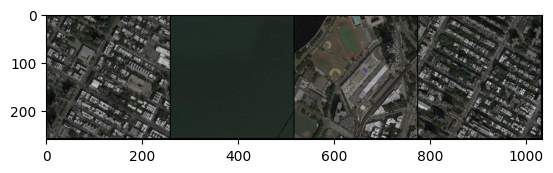

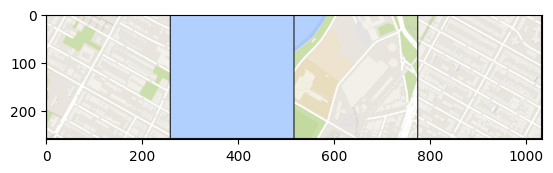

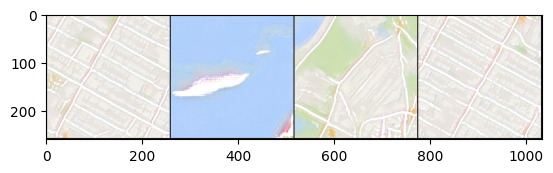

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 11: Step 11600: Generator (ResNet9) loss: 10.846141576766964, Discriminator loss: 0.17995546579360963


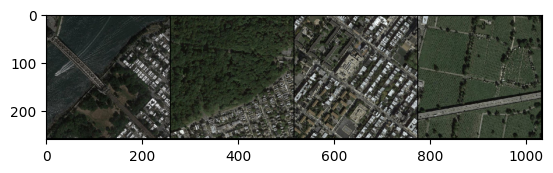

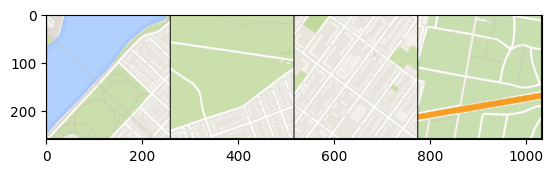

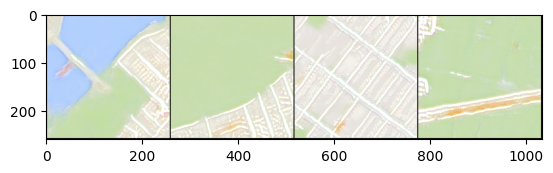

Epoch 11: Step 11800: Generator (ResNet9) loss: 10.583706800937655, Discriminator loss: 0.2418569995649158


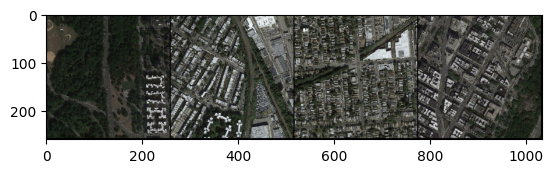

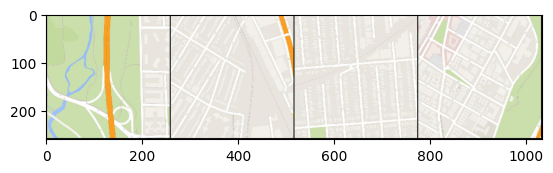

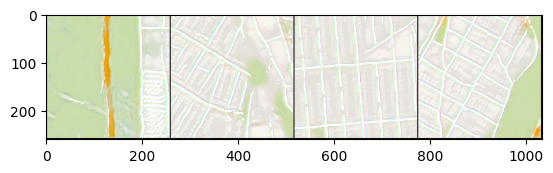

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 12: Step 12000: Generator (ResNet9) loss: 10.775139298439033, Discriminator loss: 0.19189658569637694


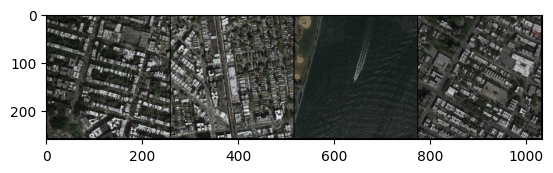

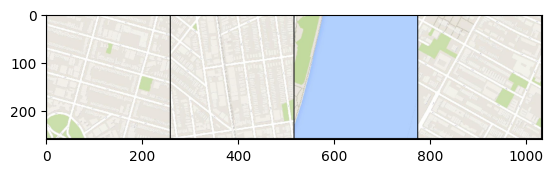

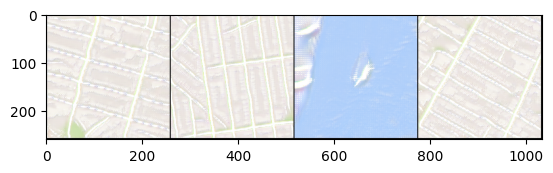

Epoch 12: Step 12200: Generator (ResNet9) loss: 10.553663182258617, Discriminator loss: 0.21801974684465672


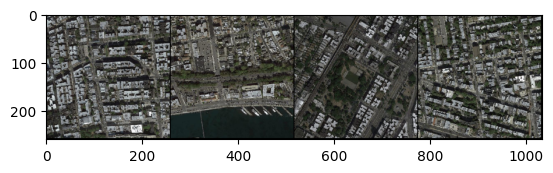

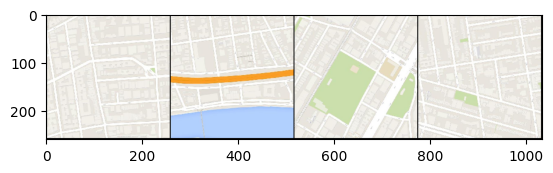

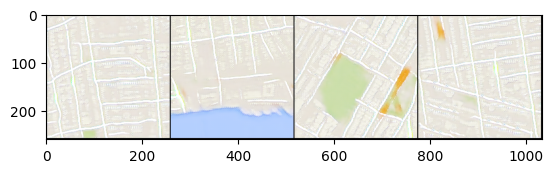

Epoch 12: Step 12400: Generator (ResNet9) loss: 10.206965904235837, Discriminator loss: 0.3014897341467438


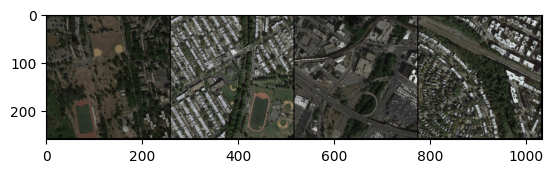

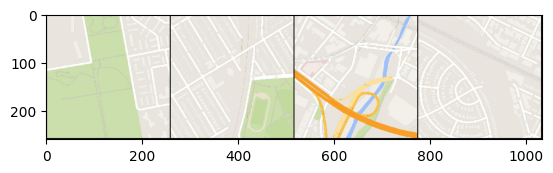

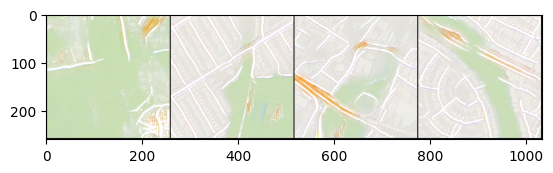

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 13: Step 12600: Generator (ResNet9) loss: 10.133987293243406, Discriminator loss: 0.2553536599688232


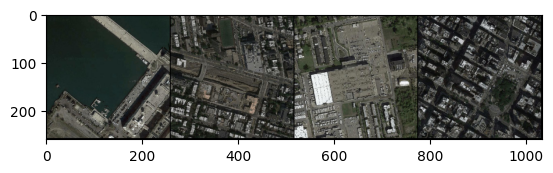

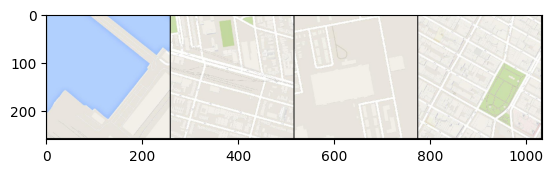

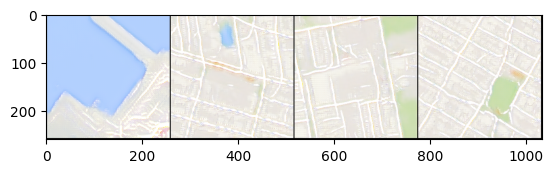

Epoch 13: Step 12800: Generator (ResNet9) loss: 9.893234195709228, Discriminator loss: 0.2971465156041087


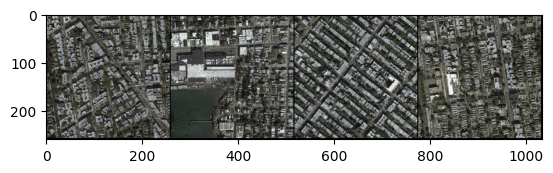

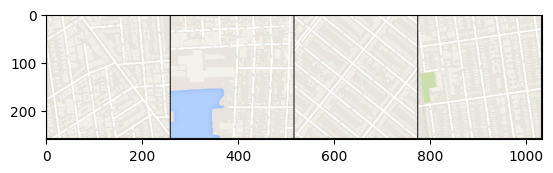

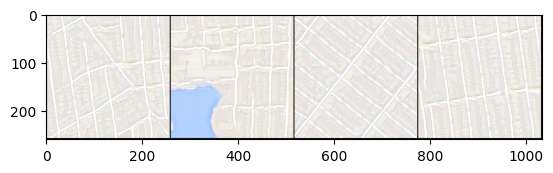

Epoch 13: Step 13000: Generator (ResNet9) loss: 10.316784765720373, Discriminator loss: 0.2569660968519746


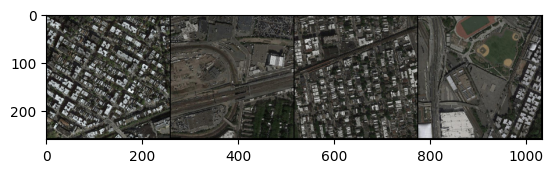

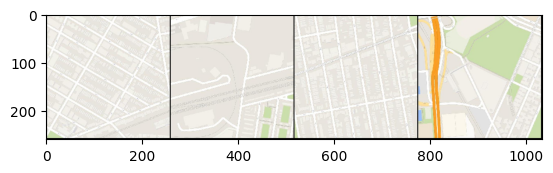

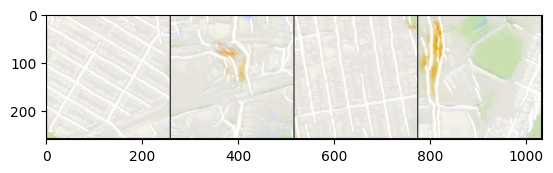

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 14: Step 13200: Generator (ResNet9) loss: 10.149226434230803, Discriminator loss: 0.24886761401779958


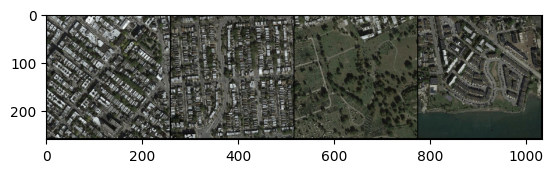

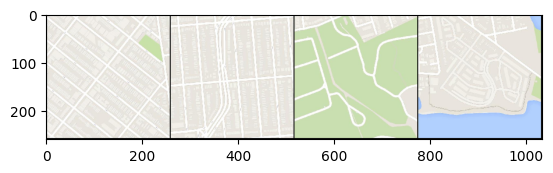

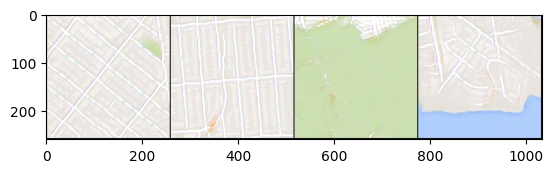

Epoch 14: Step 13400: Generator (ResNet9) loss: 9.81848278045654, Discriminator loss: 0.2804596626199781


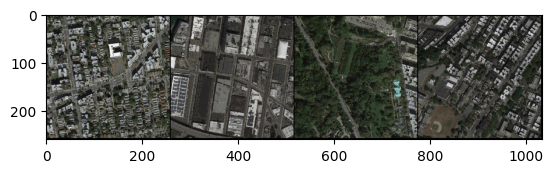

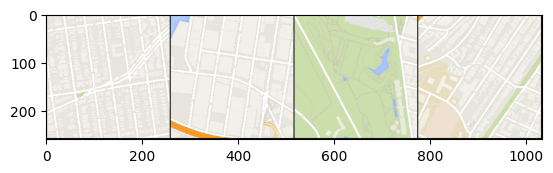

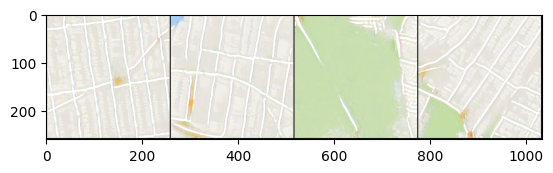

Epoch 14: Step 13600: Generator (ResNet9) loss: 10.072404022216803, Discriminator loss: 0.3087919515557587


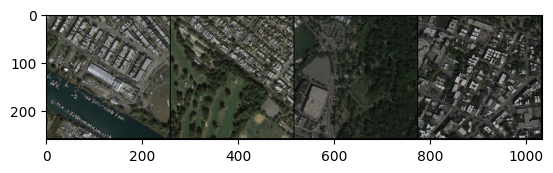

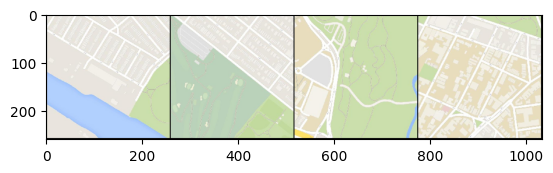

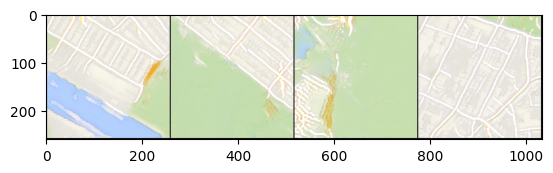

In [23]:
#from skimage import color
import numpy as np

def train(save_model=True):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    cur_step = 0

    for epoch in range(15):
        # Dataloader returns the batches
        for image, _ in tqdm(dataloader):
            image_width = image.shape[3]
            condition = image[:, :, :, :image_width // 2]
            condition = nn.functional.interpolate(condition, size=target_shape)
            real = image[:, :, :, image_width // 2:]
            real = nn.functional.interpolate(real, size=target_shape)
            cur_batch_size = len(condition)
            condition = condition.to(device)
            real = real.to(device)

            ### Update discriminator ###
            disc_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake = gen(condition)
            disc_fake_hat = disc(fake.detach(), condition) # Detach generator
            disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
            disc_real_hat = disc(real, condition)
            disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
            disc_loss = (disc_fake_loss + disc_real_loss) / 2
            disc_loss.backward(retain_graph=True) # Update gradients
            disc_opt.step() # Update optimizer

            ### Update generator ###
            gen_opt.zero_grad()
            gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)
            gen_loss.backward() # Update gradients
            gen_opt.step() # Update optimizer

            # Keep track of the average discriminator loss
            mean_discriminator_loss += disc_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                if cur_step > 0:
                    print(f"Epoch {epoch}: Step {cur_step+5400}: Generator (ResNet9) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                else:
                    print("Pretrained initial state")
                show_tensor_images(condition, size=(input_dim, target_shape, target_shape))
                show_tensor_images(real, size=(real_dim, target_shape, target_shape))
                show_tensor_images(fake, size=(real_dim, target_shape, target_shape))
                mean_generator_loss = 0
                mean_discriminator_loss = 0
                #  save_model can be changed to True to save the model
                if save_model:
                    torch.save({'gen': gen.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc': disc.state_dict(),
                        'disc_opt': disc_opt.state_dict()
                    }, f"ResNet9_{cur_step+5400}.pth")
            cur_step += 1
train()